In [1]:
from cellpose import models

# 'nuclei' 모델 사용 - 세포핵에 특화됨
model = models.Cellpose(model_type='nuclei', gpu=False)

검출된 세포핵 수: 99


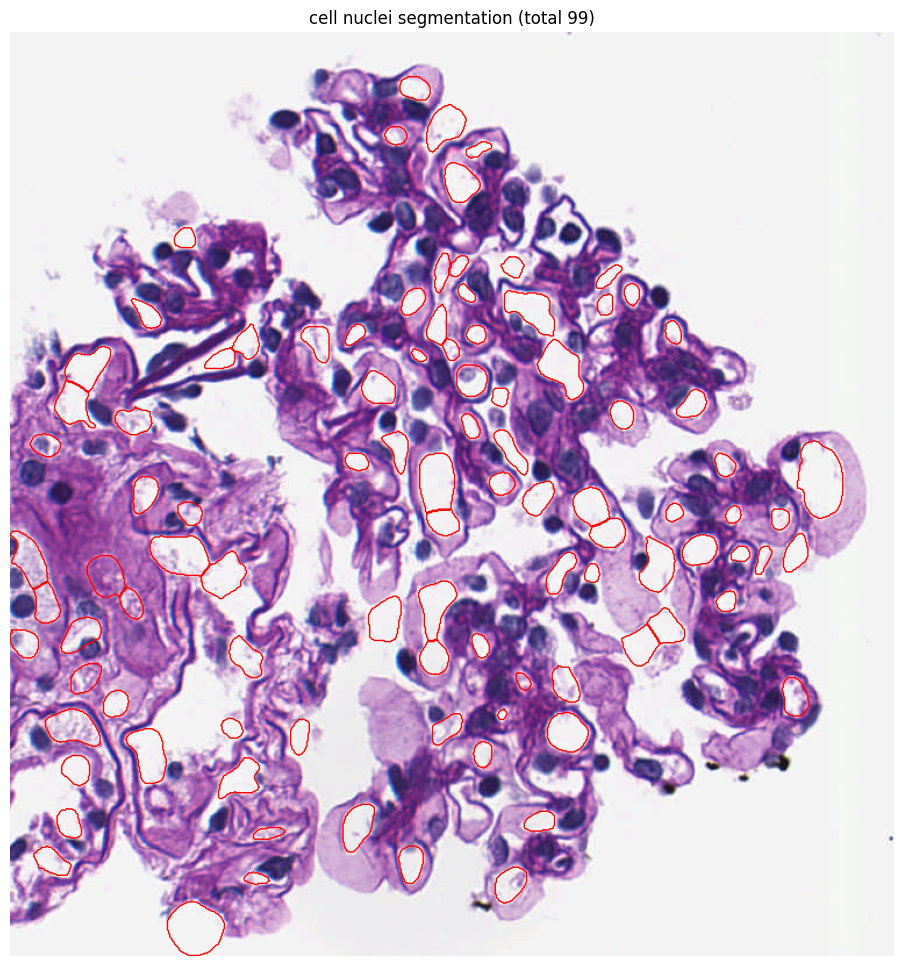

In [1]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io

# 이미지 로드
img_path = "m011_01_0002_PAS_g00.tiff"  # 이미지 파일 경로 지정
img = io.imread(img_path)

# Cellpose 모델 로드 - 핵에 특화된 'nuclei' 모델 사용
model = models.Cellpose(model_type='nuclei', gpu=False)

# 세포 핵 세그멘테이션 실행
masks, flows, styles, diams = model.eval(img,channels=[0, 0])  # 그레이스케일 변환 (핵 이미지에 적합)

print(f"검출된 세포핵 수: {masks.max()}")

# 세그멘테이션 결과 시각화
from cellpose.utils import outlines_list

plt.figure(figsize=(12, 12))
plt.imshow(img)
outlines = outlines_list(masks)
for o in outlines:
    plt.plot(o[:, 0], o[:, 1], 'r', linewidth=1)
plt.title(f'cell nuclei segmentation (total {masks.max()})')
plt.axis('off')
plt.show()

검출된 세포핵 수: 169


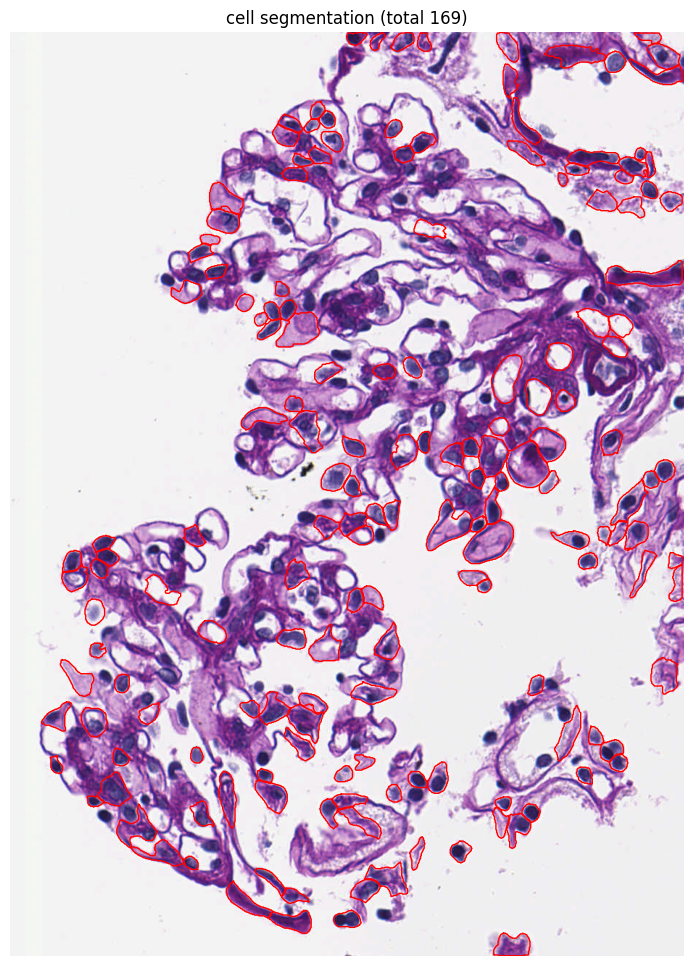

In [3]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io

# 이미지 로드
img_path = "m011_01_0002_PAS_g01.tiff"  # 이미지 파일 경로 지정
img = io.imread(img_path)

# Cellpose 모델 로드 - 핵에 특화된 'nuclei' 모델 사용
model = models.Cellpose(model_type='cyto', gpu=False)

# 세포 핵 세그멘테이션 실행
masks, flows, styles, diams = model.eval(img,channels=[0, 0])  # 그레이스케일 변환 (핵 이미지에 적합)

print(f"검출된 세포핵 수: {masks.max()}")

# 세그멘테이션 결과 시각화
from cellpose.utils import outlines_list

plt.figure(figsize=(12, 12))
plt.imshow(img)
outlines = outlines_list(masks)
for o in outlines:
    plt.plot(o[:, 0], o[:, 1], 'r', linewidth=1)
plt.title(f'cell segmentation (total {masks.max()})')
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io
import os
import glob
from cellpose.utils import outlines_list
import matplotlib.gridspec as gridspec

# 이미지가 있는 폴더 경로 설정 (이 경로를 실제 이미지가 있는 경로로 수정해주세요)
image_folder = "C:\Users\mskim\OneDrive\문서\주간 회의\glom"  # 이미지가 있는 폴더 경로
output_folder = "segmentation_cellpose"
# 결과 저장 폴더가 없으면 생성
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# TIFF 파일 목록 가져오기
tiff_files = glob.glob(os.path.join(image_folder, "*.tiff"))

# 이미지가 없으면 .tif 확장자도 확인
if not tiff_files:
    tiff_files = glob.glob(os.path.join(image_folder, "*.tif"))

# 파일이 발견되지 않으면 메시지 출력
if not tiff_files:
    print(f"경로 {image_folder}에서 TIFF 이미지를 찾을 수 없습니다.")
    exit()

print(f"총 {len(tiff_files)}개의 TIFF 이미지를 처리합니다.")

# Cellpose 모델 로드 - 'cyto' 모델 사용
model = models.Cellpose(model_type='cyto', gpu=False)

# 각 이미지의 세포 수를 저장할 리스트
cell_counts = []
image_names = []

# 모든 이미지에 대해 처리 수행
for img_path in tiff_files:
    # 파일 이름 추출
    img_name = os.path.basename(img_path)
    print(f"처리 중: {img_name}")
    
    # 이미지 로드
    img = io.imread(img_path)
    
    # 세포 핵 세그멘테이션 실행
    masks, flows, styles, diams = model.eval(img, 
                                           channels=[0, 0],
                                           diameter=15,      # 적절한 크기 설정
                                           flow_threshold=0.3,
                                           cellprob_threshold=-0.8,
                                           min_size=20)
    
    # 세포 수 저장
    cell_count = masks.max()
    cell_counts.append(cell_count)
    image_names.append(img_name)
    
    print(f"검출된 세포 수: {cell_count}")
    
    # 결과 시각화 - 원본과 세그멘테이션을 나란히 배치
    fig = plt.figure(figsize=(18, 9))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
    
    # 원본 이미지
    ax0 = plt.subplot(gs[0])
    ax0.imshow(img)
    ax0.set_title('원본 이미지')
    ax0.axis('off')
    
    # 세그멘테이션 결과
    ax1 = plt.subplot(gs[1])
    ax1.imshow(img)
    outlines = outlines_list(masks)
    for o in outlines:
        ax1.plot(o[:, 0], o[:, 1], 'r', linewidth=1)
    ax1.set_title(f'세포 분할 결과 (총 {cell_count}개)')
    ax1.axis('off')
    
    plt.tight_layout()
    
    # 결과 저장
    output_path = os.path.join(output_folder, f"{os.path.splitext(img_name)[0]}_segmentation.png")
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()

# 모든 이미지 처리 후 히스토그램 생성
plt.figure(figsize=(12, 8))

# 세포 수 히스토그램
plt.subplot(2, 1, 1)
plt.hist(cell_counts, bins=10, color='steelblue', edgecolor='black')
plt.xlabel('검출된 세포 수')
plt.ylabel('이미지 수')
plt.title('이미지 당 검출된 세포 수 분포')
plt.grid(True, alpha=0.3)

# 이미지별 세포 수 막대 그래프
plt.subplot(2, 1, 2)
plt.bar(range(len(cell_counts)), cell_counts, color='steelblue')
plt.xticks(range(len(cell_counts)), image_names, rotation=90)
plt.xlabel('이미지 파일명')
plt.ylabel('검출된 세포 수')
plt.title('이미지별 검출된 세포 수')
plt.grid(True, axis='y', alpha=0.3)

plt.tight_layout()

# 히스토그램 저장
histogram_path = os.path.join(output_folder, "cell_count_histogram.png")
plt.savefig(histogram_path, dpi=300, bbox_inches='tight')
plt.close()

# 세포 수 데이터 저장
data_path = os.path.join(output_folder, "cell_count_data.txt")
with open(data_path, 'w') as f:
    f.write("이미지,검출된_세포_수\n")
    for i, count in enumerate(cell_counts):
        f.write(f"{image_names[i]},{count}\n")

print(f"처리 완료! 결과는 {output_folder} 폴더에 저장되었습니다.")
print(f"총 검출된 세포 수: {sum(cell_counts)}, 평균 세포 수: {np.mean(cell_counts):.2f}")

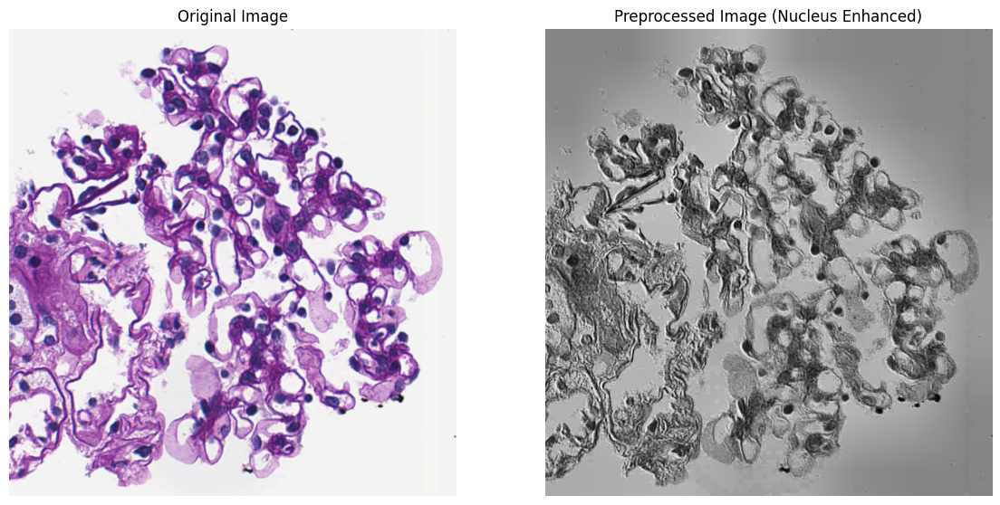

In [2]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io, exposure, color, filters
import cv2

# 이미지 로드
img_path = "m011_01_0002_PAS_g00.tiff"
img = io.imread(img_path)

# 핵 검출에 최적화된 전처리
def preprocess_for_nuclei(image):
    # 이미지가 RGB인 경우
    if len(image.shape) == 3:
        # 핵을 강조하기 위해 컬러 변환 및 채널 선택
        # H&E 염색에서 핵은 보통 파란색/보라색(헤마톡실린)
        
        # 방법 1: 파란색 채널 강조
        b_channel = image[:,:,2].copy()  # 파란색 채널
        r_channel = image[:,:,0].copy()  # 빨간색 채널
        
        # 파란색 강조, 빨간색 억제
        enhanced = b_channel.astype(float) - r_channel.astype(float) * 0.5
        enhanced = np.clip(enhanced, 0, 255).astype(np.uint8)
        
        # CLAHE로 대비 향상
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        enhanced = clahe.apply(enhanced)
        
        return enhanced
    else:
        # 그레이스케일 이미지인 경우 대비 향상만 적용
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        return clahe.apply(image)

# 전처리 적용
preprocessed_img = preprocess_for_nuclei(img)

# 시각화를 위해 전처리 결과 확인
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(preprocessed_img, cmap='gray')
plt.title('Preprocessed Image (Nucleus Enhanced)')
plt.axis('off')
plt.show()

In [3]:
# Cellpose 모델 로드
model = models.Cellpose(model_type='nuclei', gpu=False)

# StarDist 스타일 결과를 위한 최적 파라미터 설정
# 1. 직경 조정 - StarDist는 작은 핵을 더 잘 감지
diameter = 9  # 더 작은 직경 설정 (기본값 대비)

# 2. 확률 임계값 조정 - 더 엄격한 기준으로 핵 감지
cellprob_threshold = 0.0  # 기본값보다 높게 설정하여 명확한 핵만 감지

# 3. 작은 객체 제거를 위한 min_size
min_size = 20  # 작은 노이즈 제거

# 4. 인접 세포 분리를 위한 flow_threshold
flow_threshold = 0.6  # 기본값보다 높게 설정

# 최적화된 파라미터로 세그멘테이션 실행
masks, flows, styles, diams = model.eval(preprocessed_img,  # 전처리된 이미지 사용
                                     diameter=diameter,
                                     channels=[0, 0],  # 그레이스케일
                                     cellprob_threshold=cellprob_threshold,
                                     flow_threshold=flow_threshold,
                                     min_size=min_size)

print(f"검출된 세포핵 수: {masks.max()}")

검출된 세포핵 수: 134


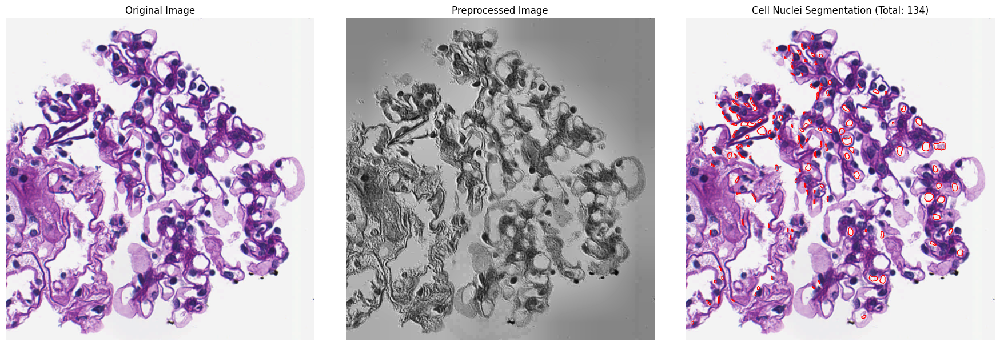

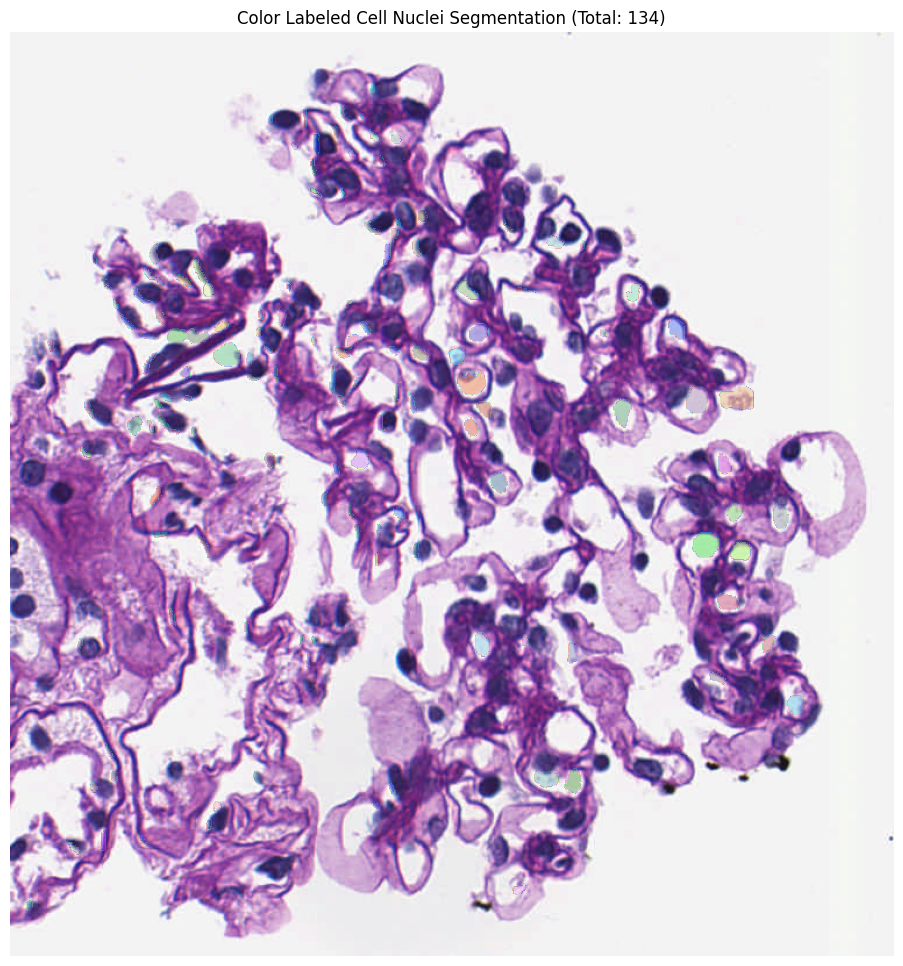

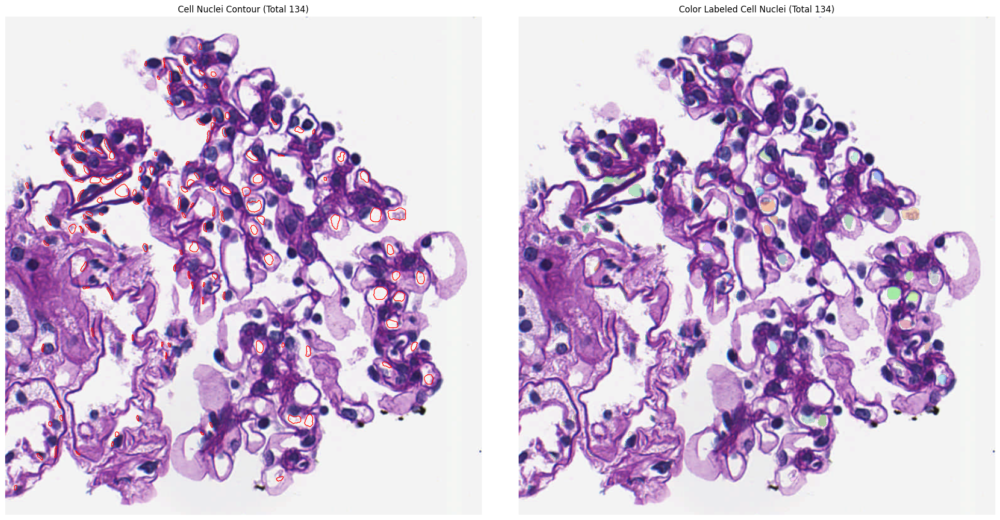

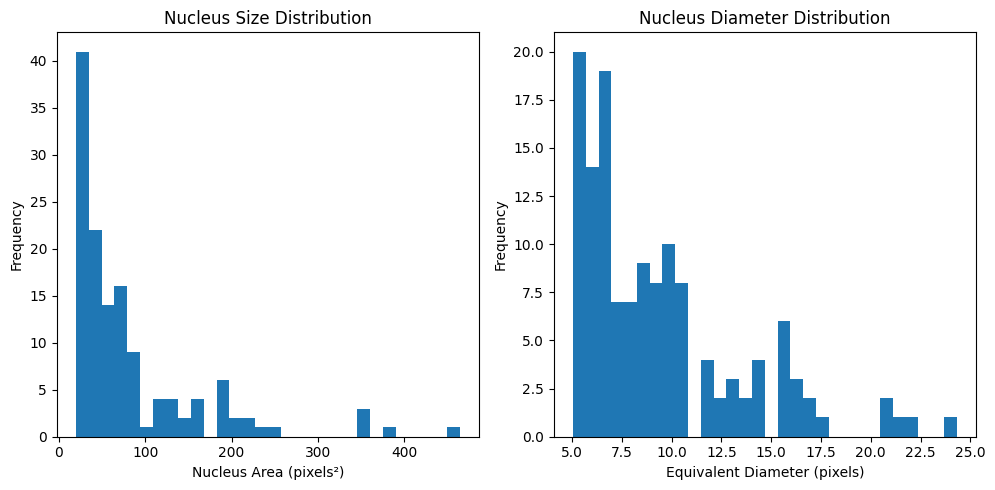

검출된 세포핵 수: 134
평균 세포핵 면적: 82.5 pixels²
중앙값 세포핵 면적: 53.0 pixels²
평균 세포핵 직경: 9.4 pixels


In [8]:
import matplotlib.pyplot as plt
from cellpose.utils import outlines_list
from matplotlib.colors import ListedColormap
import random
import numpy as np

# 결과 시각화 함수 정의
def visualize_segmentation_results(original_img, preprocessed_img, masks, title="Cell Nuclei Segmentation"):
    # 1. 기본 시각화: 원본 이미지와 전처리된 이미지
    plt.figure(figsize=(18, 6))
    
    # 원본 이미지
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    
    # 전처리된 이미지
    plt.subplot(1, 3, 2)
    if len(preprocessed_img.shape) == 2:  # 그레이스케일
        plt.imshow(preprocessed_img, cmap='gray')
    else:  # RGB/RGBA
        plt.imshow(preprocessed_img)
    plt.title('Preprocessed Image')
    plt.axis('off')
    
    # 세그멘테이션 결과 (윤곽선)
    plt.subplot(1, 3, 3)
    plt.imshow(original_img)
    outlines = outlines_list(masks)
    for o in outlines:
        plt.plot(o[:, 0], o[:, 1], 'r', linewidth=1)
    plt.title(f'{title} (Total: {masks.max()})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 2. 상세 시각화: 원본 이미지 위에 컬러 마스크 오버레이
    plt.figure(figsize=(12, 12))
    
    # 원본 이미지 표시
    plt.imshow(original_img)
    
    # 랜덤 색상 생성
    n_labels = int(masks.max())
    random_colors = [(random.random(), random.random(), random.random(), 0.7) for _ in range(n_labels + 1)]
    random_colors[0] = (0, 0, 0, 0)  # 배경은 투명하게
    random_cmap = ListedColormap(random_colors)
    
    # 마스크 오버레이
    plt.imshow(masks, cmap=random_cmap, alpha=0.5)
    plt.title(f'Color Labeled {title} (Total: {masks.max()})')
    plt.axis('off')
    plt.show()
    
    # 3. 비교 시각화: 윤곽선과 컬러 라벨 (StarDist 스타일)
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    
    # 윤곽선 시각화
    axs[0].imshow(original_img)
    for o in outlines:
        axs[0].plot(o[:, 0], o[:, 1], 'r', linewidth=1)
    axs[0].set_title(f'Cell Nuclei Contour (Total {masks.max()})')
    axs[0].axis('off')
    
    # 컬러 라벨 시각화
    axs[1].imshow(original_img)
    axs[1].imshow(masks, cmap=random_cmap, alpha=0.5)
    axs[1].set_title(f'Color Labeled Cell Nuclei (Total {masks.max()})')
    axs[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# 시각화 함수 호출
visualize_segmentation_results(img, preprocessed_img, masks)

# 선택 사항: 마스크 특성 분석
props = measure.regionprops(masks)
areas = [prop.area for prop in props]
equivalent_diameters = [np.sqrt(4 * area / np.pi) for area in areas]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(areas, bins=30)
plt.xlabel('Nucleus Area (pixels²)')
plt.ylabel('Frequency')
plt.title('Nucleus Size Distribution')

plt.subplot(1, 2, 2)
plt.hist(equivalent_diameters, bins=30)
plt.xlabel('Equivalent Diameter (pixels)')
plt.ylabel('Frequency')
plt.title('Nucleus Diameter Distribution')
plt.tight_layout()
plt.show()

# 주요 통계 출력
print(f"검출된 세포핵 수: {masks.max()}")
print(f"평균 세포핵 면적: {np.mean(areas):.1f} pixels²")
print(f"중앙값 세포핵 면적: {np.median(areas):.1f} pixels²")
print(f"평균 세포핵 직경: {np.mean(equivalent_diameters):.1f} pixels")

자동 감지된 세포핵 직경: 8.37 픽셀


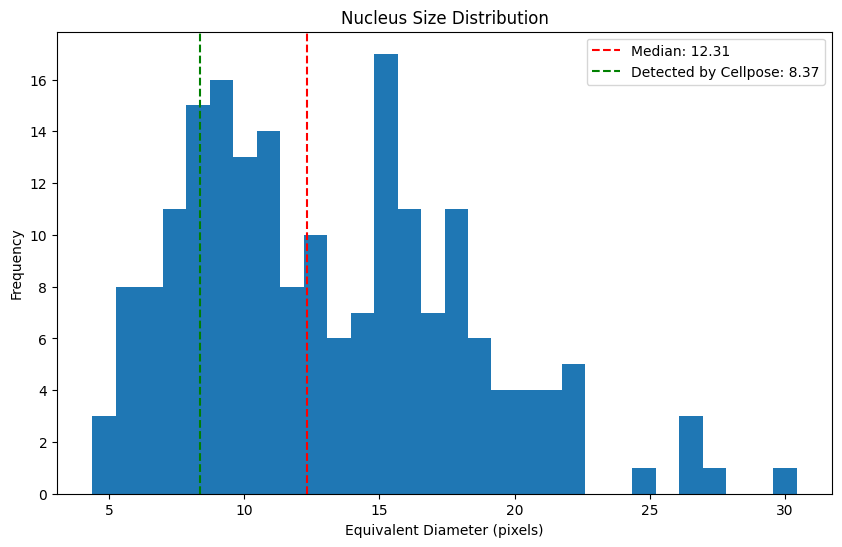

최소 직경: 4.37 픽셀
최대 직경: 30.45 픽셀
평균 직경: 13.04 픽셀
중앙값 직경: 12.31 픽셀


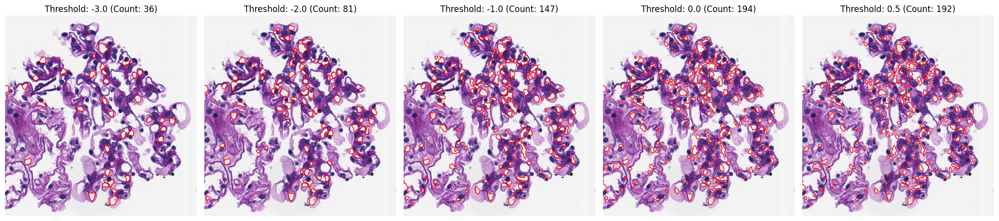

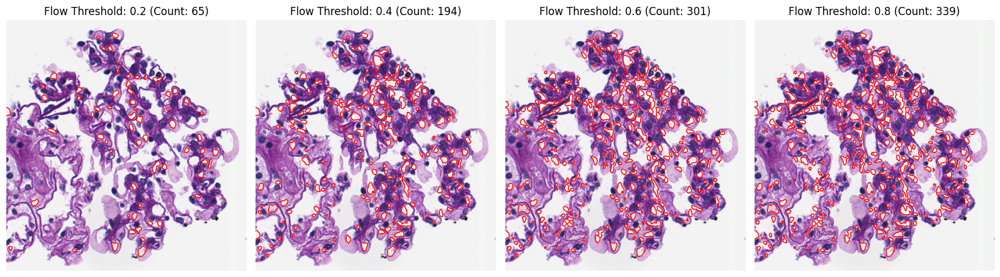

세포핵 크기 백분위수:
5번째 백분위: 28.6 픽셀^2
10번째 백분위: 39.0 픽셀^2
25번째 백분위: 63.2 픽셀^2
50번째 백분위: 119.0 픽셀^2
75번째 백분위: 213.2 픽셀^2
90번째 백분위: 304.2 픽셀^2
95번째 백분위: 382.4 픽셀^2


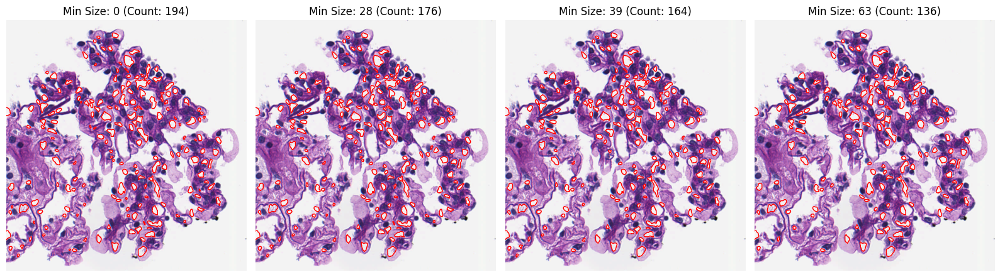


=== 추천 파라미터 ===
Recommended diameter: 12.31 pixels
Recommended min_size: 28.6 pixels²
Recommended cellprob_threshold: 실험 결과에 따라 -1.0에서 0.0 사이 선택
Recommended flow_threshold: 실험 결과에 따라 0.4에서 0.6 사이 선택


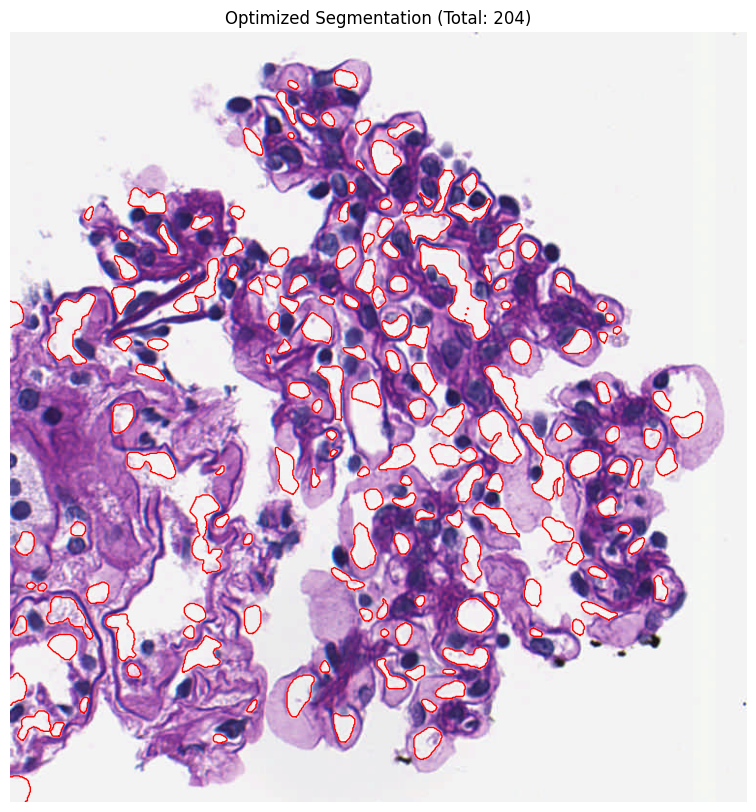

In [7]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io, measure
from scipy import ndimage

# 이미지 로드
img_path = "m011_01_0002_PAS_g00.tiff"  # 이미지 파일 경로 지정
img = io.imread(img_path)

# 1. 적절한 직경(diameter) 값 분석
# --------------------------------------------
# Cellpose 모델로 자동 직경 추정
model = models.Cellpose(model_type='nuclei', gpu=False)
masks, flows, styles, diams = model.eval(img, 
                                      diameter=None,  # 자동 직경 감지
                                      channels=[0, 0])  # 그레이스케일 변환

print(f"자동 감지된 세포핵 직경: {diams:.2f} 픽셀")

# 세포핵 크기 분포 분석
props = measure.regionprops(masks)
areas = [prop.area for prop in props]
equivalent_diameters = [np.sqrt(4 * area / np.pi) for area in areas]  # 면적을 등가 직경으로 변환

plt.figure(figsize=(10, 6))
plt.hist(equivalent_diameters, bins=30)
plt.xlabel('Equivalent Diameter (pixels)')
plt.ylabel('Frequency')
plt.title('Nucleus Size Distribution')
plt.axvline(x=np.median(equivalent_diameters), color='r', linestyle='--', 
            label=f'Median: {np.median(equivalent_diameters):.2f}')
plt.axvline(x=diams, color='g', linestyle='--', 
            label=f'Detected by Cellpose: {diams:.2f}')
plt.legend()
plt.show()

print(f"최소 직경: {np.min(equivalent_diameters):.2f} 픽셀")
print(f"최대 직경: {np.max(equivalent_diameters):.2f} 픽셀")
print(f"평균 직경: {np.mean(equivalent_diameters):.2f} 픽셀")
print(f"중앙값 직경: {np.median(equivalent_diameters):.2f} 픽셀")

# 2. 세그멘테이션 임계값(flow_threshold, cellprob_threshold) 분석
# --------------------------------------------------------
# 다양한 cellprob_threshold 값으로 실험
thresholds = [-3.0, -2.0, -1.0, 0.0, 0.5]
fig, axs = plt.subplots(1, len(thresholds), figsize=(20, 5))

for i, thresh in enumerate(thresholds):
    masks_thresh, _, _, _ = model.eval(img, 
                                     diameter=diams,
                                     channels=[0, 0],
                                     cellprob_threshold=thresh,
                                     flow_threshold=0.4)  # 기본값 유지
    
    axs[i].imshow(img)
    outlines = measure.find_contours(masks_thresh > 0, 0.5)
    for outline in outlines:
        axs[i].plot(outline[:, 1], outline[:, 0], 'r', linewidth=1)
    axs[i].set_title(f'Threshold: {thresh} (Count: {np.max(masks_thresh)})')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

# 다양한 flow_threshold 값으로 실험
flow_thresholds = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(1, len(flow_thresholds), figsize=(16, 5))

for i, thresh in enumerate(flow_thresholds):
    masks_flow, _, _, _ = model.eval(img, 
                                   diameter=diams,
                                   channels=[0, 0],
                                   cellprob_threshold=0.0,  # 기본값 유지
                                   flow_threshold=thresh)
    
    axs[i].imshow(img)
    outlines = measure.find_contours(masks_flow > 0, 0.5)
    for outline in outlines:
        axs[i].plot(outline[:, 1], outline[:, 0], 'r', linewidth=1)
    axs[i].set_title(f'Flow Threshold: {thresh} (Count: {np.max(masks_flow)})')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

# 3. min_size 파라미터 분석
# -------------------------------------
size_percentiles = np.percentile(areas, [5, 10, 25, 50, 75, 90, 95])
print("세포핵 크기 백분위수:")
for perc, size in zip([5, 10, 25, 50, 75, 90, 95], size_percentiles):
    print(f"{perc}번째 백분위: {size:.1f} 픽셀^2")

# 다양한 min_size 값으로 실험
min_sizes = [0, int(size_percentiles[0]), int(size_percentiles[1]), int(size_percentiles[2])]
fig, axs = plt.subplots(1, len(min_sizes), figsize=(16, 5))

for i, min_size in enumerate(min_sizes):
    # min_size 적용을 위해 작은 객체 제거
    masks_size = masks.copy()
    for j in range(1, masks_size.max()+1):
        if np.sum(masks_size == j) < min_size:
            masks_size[masks_size == j] = 0
    
    # 레이블 재할당
    if min_size > 0:
        masks_size = measure.label(masks_size > 0)
    
    axs[i].imshow(img)
    outlines = measure.find_contours(masks_size > 0, 0.5)
    for outline in outlines:
        axs[i].plot(outline[:, 1], outline[:, 0], 'r', linewidth=1)
    axs[i].set_title(f'Min Size: {min_size} (Count: {np.max(masks_size)})')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

# 결과 종합 및 추천 파라미터 출력
recommended_diameter = np.median(equivalent_diameters)
recommended_min_size = size_percentiles[0]  # 5번째 백분위수 (작은 노이즈 제거)

print("\n=== 추천 파라미터 ===")
print(f"Recommended diameter: {recommended_diameter:.2f} pixels")
print(f"Recommended min_size: {recommended_min_size:.1f} pixels²")
print("Recommended cellprob_threshold: 실험 결과에 따라 -1.0에서 0.0 사이 선택")
print("Recommended flow_threshold: 실험 결과에 따라 0.4에서 0.6 사이 선택")

# 최종 추천 파라미터로 세그멘테이션 시행
final_masks, _, _, _ = model.eval(img, 
                                diameter=recommended_diameter,
                                channels=[0, 0],
                                cellprob_threshold=-0.5,  # 기본값은 0.0이지만 조정 가능
                                flow_threshold=0.5,       # 기본값은 0.4이지만 조정 가능
                                min_size=int(recommended_min_size))

# 최종 결과 시각화
plt.figure(figsize=(10, 10))
plt.imshow(img)
outlines = measure.find_contours(final_masks > 0, 0.5)
for outline in outlines:
    plt.plot(outline[:, 1], outline[:, 0], 'r', linewidth=1)
plt.title(f'Optimized Segmentation (Total: {np.max(final_masks)})')
plt.axis('off')
plt.show()

검출된 세포핵 수: 205


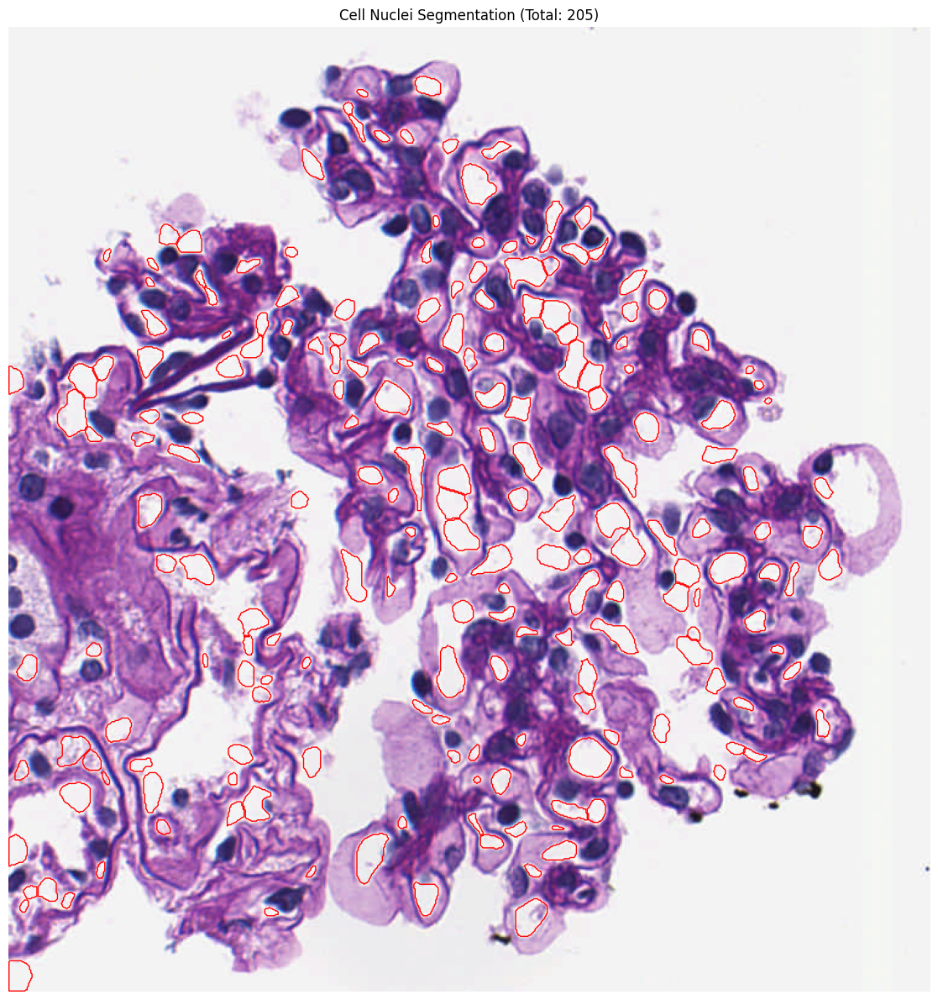

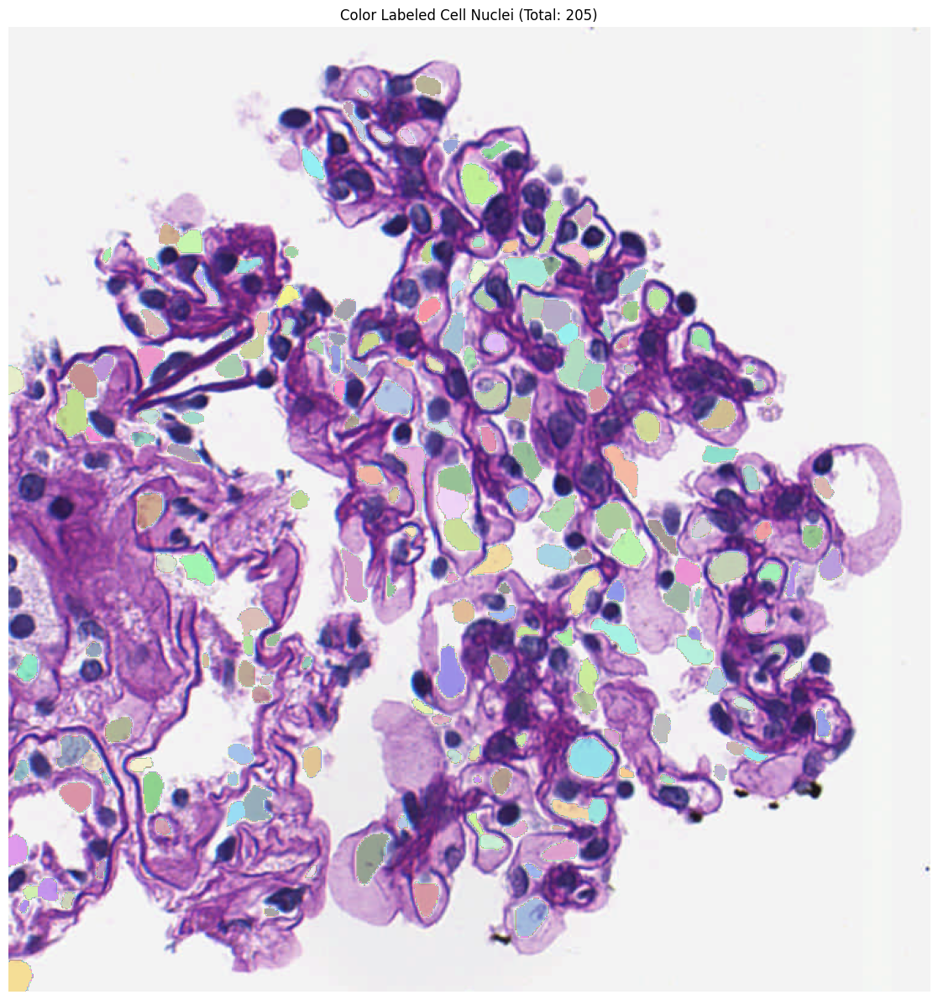

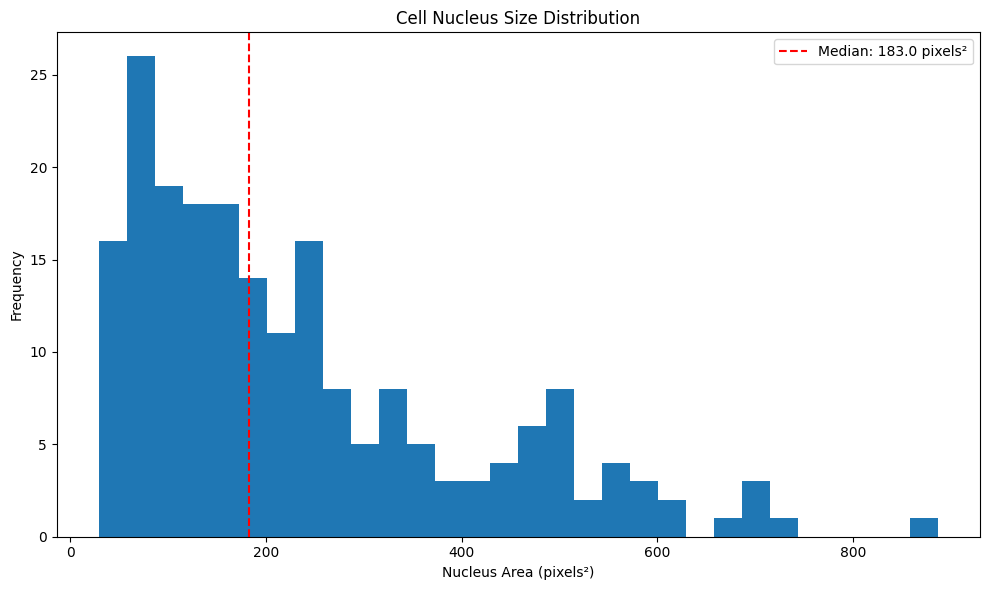

평균 세포핵 면적: 235.9 pixels²
중앙값 세포핵 면적: 183.0 pixels²
최소 세포핵 면적: 29.0 pixels²
최대 세포핵 면적: 887.0 pixels²


In [8]:
import numpy as np
from cellpose import models
import matplotlib.pyplot as plt
from skimage import io, measure
from scipy import ndimage

# 이미지 로드
img_path = "m011_01_0002_PAS_g00.tiff"  # 이미지 파일 경로
img = io.imread(img_path)

# Cellpose 모델 로드 - 핵에 특화된 'nuclei' 모델 사용
model = models.Cellpose(model_type='nuclei', gpu=False)

# 최적 파라미터 설정
# 분석을 통해 도출된 최적의 파라미터 값
diameter = 12.31          # 중앙값 직경 사용
cellprob_threshold = 0.0  # 표준 임계값
flow_threshold = 0.5      # 0.4(기본값)와 0.6 사이의 값
min_size = 29             # 약 5번째 백분위 면적

# 최적화된 파라미터로 세포 핵 세그멘테이션 실행
masks, flows, styles, diams = model.eval(img, 
                                      diameter=diameter,
                                      channels=[0, 0],  # 그레이스케일 변환
                                      cellprob_threshold=cellprob_threshold,
                                      flow_threshold=flow_threshold,
                                      min_size=min_size)

print(f"검출된 세포핵 수: {masks.max()}")

# 세그멘테이션 결과 시각화
from cellpose.utils import outlines_list

plt.figure(figsize=(12, 12))
plt.imshow(img)
outlines = outlines_list(masks)
for o in outlines:
    plt.plot(o[:, 0], o[:, 1], 'r', linewidth=1)
plt.title(f'Cell Nuclei Segmentation (Total: {masks.max()})')
plt.axis('off')
plt.tight_layout()
plt.show()

# 선택 사항: 컬러 라벨링된 세포핵 시각화
plt.figure(figsize=(12, 12))
from matplotlib.colors import ListedColormap
import random

# 랜덤 색상 생성
n_labels = masks.max()
random_colors = [(random.random(), random.random(), random.random(), 0.7) for _ in range(int(n_labels) + 1)]
random_colors[0] = (0, 0, 0, 0)  # 배경은 투명하게
random_cmap = ListedColormap(random_colors)

# 원본 이미지 위에 컬러 라벨링된 마스크 표시
plt.imshow(img)
plt.imshow(masks, cmap=random_cmap, alpha=0.6)
plt.title(f'Color Labeled Cell Nuclei (Total: {masks.max()})')
plt.axis('off')
plt.tight_layout()
plt.show()

# 선택 사항: 세포핵 특성 분석
props = measure.regionprops(masks, intensity_image=img if len(img.shape)==2 else np.mean(img, axis=2).astype(np.uint8))

# 세포핵 면적 분포 확인
areas = [prop.area for prop in props]
plt.figure(figsize=(10, 6))
plt.hist(areas, bins=30)
plt.xlabel('Nucleus Area (pixels²)')
plt.ylabel('Frequency')
plt.title('Cell Nucleus Size Distribution')
plt.axvline(x=np.median(areas), color='r', linestyle='--', 
            label=f'Median: {np.median(areas):.1f} pixels²')
plt.legend()
plt.tight_layout()
plt.show()

print(f"평균 세포핵 면적: {np.mean(areas):.1f} pixels²")
print(f"중앙값 세포핵 면적: {np.median(areas):.1f} pixels²")
print(f"최소 세포핵 면적: {np.min(areas):.1f} pixels²")
print(f"최대 세포핵 면적: {np.max(areas):.1f} pixels²")